# Clustering and dimeonsionality reduction techniques combined


In this notebook, we show how the clustering performance changes when dimensionality reduction techniques like Principal component analysis (PCA), Independent component analysis (ICA), or Random projections (RP) is combined with algorithms like k-means.

[Read about ___k-means clustering algorithm___ here.](https://en.wikipedia.org/wiki/K-means_clustering)

[Read about ___principal component analysis___ here](https://en.wikipedia.org/wiki/Principal_component_analysis)

[Read about ___independent component analysis___ here](https://en.wikipedia.org/wiki/Independent_component_analysis)

---

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

### Create synthetic data using Scikit learn `make_blob` method

- Number of features: 8
- Number of clusters: 5
- Number of samples: 1000

In [3]:
from sklearn.datasets import make_classification
from sklearn.datasets import make_blobs

In [4]:
n_features = 8
n_cluster = 5
cluster_std = 1.5
n_samples = 1000

In [5]:
data1 = make_blobs(n_samples=n_samples,n_features=n_features,centers=n_cluster,cluster_std=cluster_std)

In [6]:
d1 = data1[0]

In [7]:
df1=pd.DataFrame(data=d1,columns=['Feature_'+str(i) for i in range(1,n_features+1)])
df1.head()

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8
0,3.558580,-1.841658,4.113445,-1.759462,4.043890,-8.910404,-6.982889,-5.586113
1,-10.029909,-8.847647,-9.169302,-4.136698,7.468986,-2.596163,-8.357126,-8.067587
2,-10.369046,-6.234534,-8.442401,-3.977540,10.123536,-2.622317,-6.461508,-9.569952
3,3.800949,-1.729437,9.182090,-6.267864,1.737487,-8.824700,-1.580170,-4.083346
4,7.265431,-9.539821,-7.982503,-3.533808,-1.251753,6.367552,6.590940,-5.289511


In [8]:
from itertools import combinations

In [9]:
lst_vars=list(combinations(df1.columns,2))

In [10]:
len(lst_vars)

28

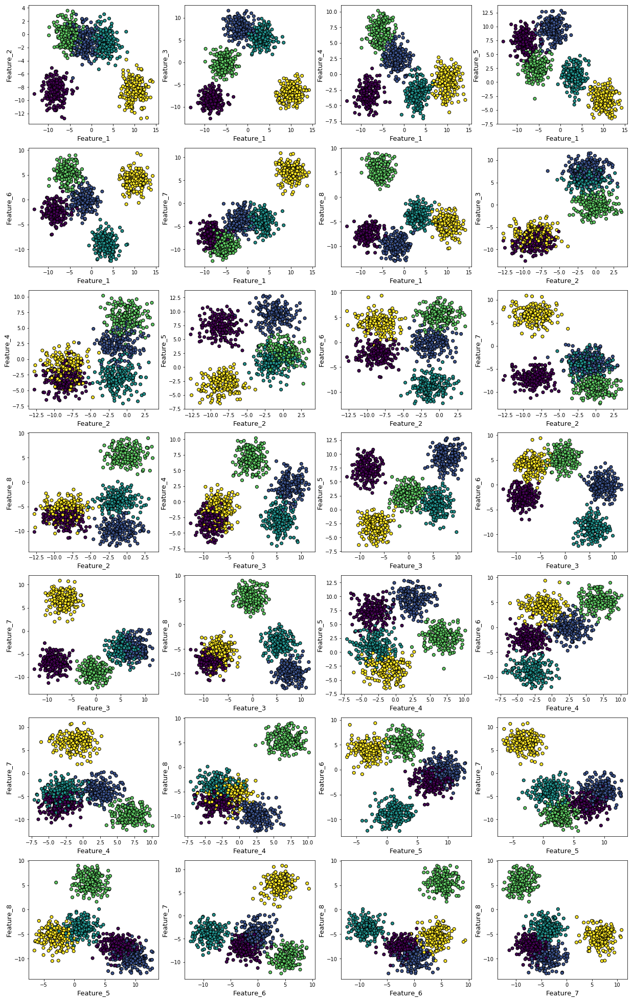

In [11]:
plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=data1[1],edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

In [15]:
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
Feature_1,1000.0,-0.429677,6.698800,-13.203284,-6.242825,-1.693969,4.324214,14.195717
Feature_2,1000.0,-3.886649,4.075708,-12.752790,-8.080517,-2.319321,-0.534558,3.572423
Feature_3,1000.0,-0.425367,6.625068,-12.608858,-7.045539,-0.324261,5.953907,11.565049
Feature_4,1000.0,0.378588,4.103578,-7.081501,-2.961169,-0.684839,3.399205,10.154459
Feature_5,1000.0,3.469164,4.707852,-6.534970,-0.009139,3.079245,7.663985,12.834717
Feature_6,1000.0,-0.440355,5.238562,-12.331660,-3.471827,-0.026959,4.116466,9.372385
Feature_7,1000.0,-3.353896,5.611039,-12.509801,-7.310357,-4.684718,-2.010043,10.873957
Feature_8,1000.0,-4.184301,5.470751,-13.041131,-8.027369,-5.460013,-2.729957,8.977362


### How are the classes separated (boxplots)

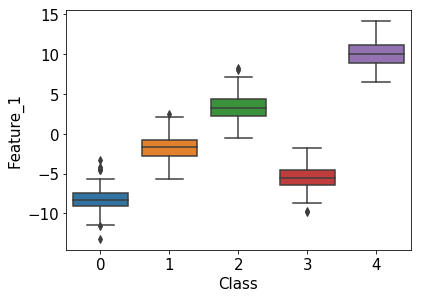

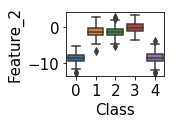

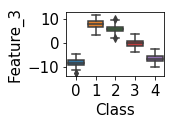

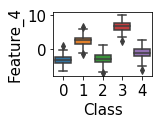

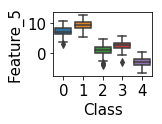

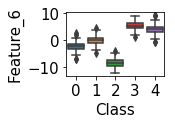

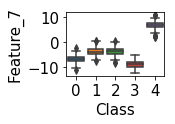

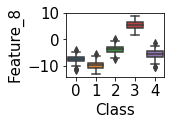

In [76]:
plt.figure(figsize=(21,15))
for i,c in enumerate(df1.columns):
    plt.subplot(3,3,i+1)
    sns.boxplot(y=df1[c],x=data1[1])
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    plt.xlabel("Class",fontsize=15)
    plt.ylabel(c,fontsize=15)
    plt.show()

## k-means clustering

In [17]:
from sklearn.cluster import KMeans

### Unlabled data

In [18]:
X=df1

In [19]:
X.head()

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8
0,3.558580,-1.841658,4.113445,-1.759462,4.043890,-8.910404,-6.982889,-5.586113
1,-10.029909,-8.847647,-9.169302,-4.136698,7.468986,-2.596163,-8.357126,-8.067587
2,-10.369046,-6.234534,-8.442401,-3.977540,10.123536,-2.622317,-6.461508,-9.569952
3,3.800949,-1.729437,9.182090,-6.267864,1.737487,-8.824700,-1.580170,-4.083346
4,7.265431,-9.539821,-7.982503,-3.533808,-1.251753,6.367552,6.590940,-5.289511


In [26]:
y=data1[1]

### Scaling

In [27]:
from sklearn.preprocessing import MinMaxScaler

In [28]:
scaler = MinMaxScaler()

In [29]:
X_scaled=scaler.fit_transform(X)

### Metrics

In [30]:
from sklearn.metrics import silhouette_score, adjusted_rand_score, completeness_score, v_measure_score

### Running k-means and computing inter-cluster distance score for various *k* values

In [31]:
km_scores= []
km_silhouette = []
vmeasure_score =[]
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_scaled)
    preds = km.predict(X_scaled)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_scaled)))
    km_scores.append(-km.score(X_scaled))
    silhouette = silhouette_score(X_scaled,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -329.35532371374086
Silhouette score for number of cluster(s) 2: 0.39455593930856403
V-measure score for number of cluster(s) 2: 0.4743509876140318
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -202.88651724706074
Silhouette score for number of cluster(s) 3: 0.49102327763955317
V-measure score for number of cluster(s) 3: 0.7424834172925042
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -99.29018271887665
Silhouette score for number of cluster(s) 4: 0.6159983865121472
V-measure score for number of cluster(s) 4: 0.9057460992755191
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -42.65083303006074
Silhouette score for number of cluster(s) 5: 0.6891159902049724
V-measure score for number of cluste

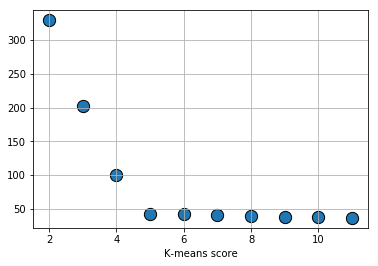

In [32]:
plt.scatter(x=[i for i in range(2,12)],y=km_scores,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("K-means score")
plt.show()

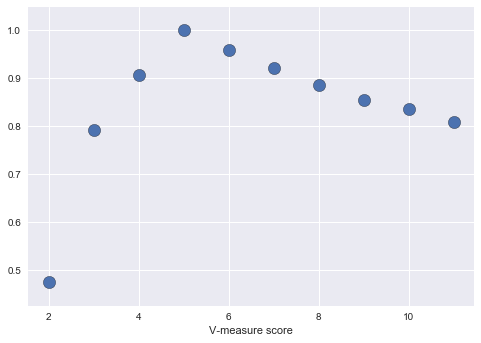

In [23]:
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("V-measure score")
plt.show()

In [33]:
km = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_scaled)

In [34]:
preds_km = km.predict(X_scaled)

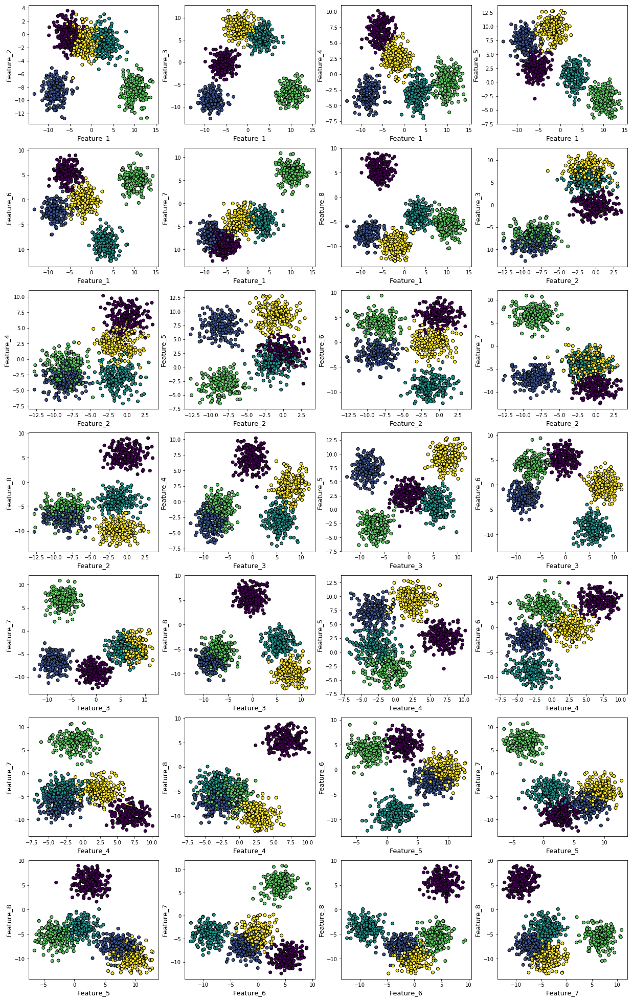

In [35]:
plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=preds_km,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## Expectation-maximization (Gaussian Mixture Model)

In [40]:
from sklearn.mixture import GaussianMixture

In [41]:
gm_bic= []
gm_score=[]
for i in range(2,12):
    gm = GaussianMixture(n_components=i,n_init=10,tol=1e-3,max_iter=1000).fit(X_scaled)
    print("BIC for number of cluster(s) {}: {}".format(i,gm.bic(X_scaled)))
    print("Log-likelihood score for number of cluster(s) {}: {}".format(i,gm.score(X_scaled)))
    print("-"*100)
    gm_bic.append(-gm.bic(X_scaled))
    gm_score.append(gm.score(X_scaled))

BIC for number of cluster(s) 2: -11889.738169763146
Log-likelihood score for number of cluster(s) 2: 6.252264194796278
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 3: -13604.554906466856
Log-likelihood score for number of cluster(s) 3: 7.2650970569252316
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 4: -14518.260771127087
Log-likelihood score for number of cluster(s) 4: 7.877374483032445
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 5: -14988.619580758183
Log-likelihood score for number of cluster(s) 5: 8.267978381625092
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 6: -14754.423554989533
Log-likelihood score for number of cluster(s) 6: 8.306304862517864


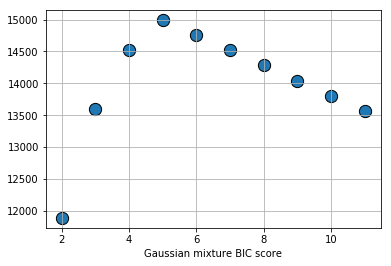

In [42]:
plt.scatter(x=[i for i in range(2,12)],y=gm_bic,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("Gaussian mixture BIC score")
plt.show()

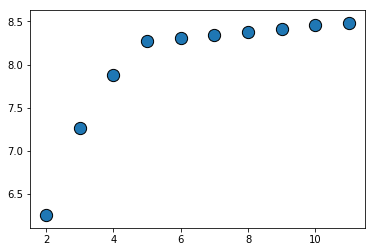

In [63]:
plt.scatter(x=[i for i in range(2,12)],y=gm_score,s=150,edgecolor='k')
plt.show()

In [64]:
gm = GaussianMixture(n_components=5,verbose=1,n_init=10,tol=1e-2,covariance_type='full',max_iter=1000).fit(X_scaled)

Initialization 0
Initialization converged: True
Initialization 1
Initialization converged: True
Initialization 2
Initialization converged: True
Initialization 3
Initialization converged: True
Initialization 4
Initialization converged: True
Initialization 5
Initialization converged: True
Initialization 6
Initialization converged: True
Initialization 7
Initialization converged: True
Initialization 8
Initialization converged: True
Initialization 9
Initialization converged: True


In [65]:
gm.means_

array([[0.84831008, 0.26347129, 0.24430476, 0.34160749, 0.1799875 ,
        0.74835286, 0.82239725, 0.3408365 ],
       [0.6034515 , 0.70687734, 0.75281288, 0.23749548, 0.38990719,
        0.16297811, 0.36700117, 0.42143202],
       [0.28067496, 0.77753415, 0.51071327, 0.80459804, 0.47552092,
        0.81146374, 0.15388508, 0.8453537 ],
       [0.41814192, 0.7116518 , 0.84172815, 0.55892415, 0.82504132,
        0.55903489, 0.37430245, 0.14838852],
       [0.1804567 , 0.25594038, 0.17040832, 0.22148073, 0.71196307,
        0.45759171, 0.24016293, 0.25521463]])

In [66]:
km.cluster_centers_

array([[0.28067496, 0.77753415, 0.51071327, 0.80459804, 0.47552092,
        0.81146374, 0.15388508, 0.8453537 ],
       [0.1804567 , 0.25594038, 0.17040832, 0.22148073, 0.71196307,
        0.45759171, 0.24016293, 0.25521463],
       [0.6034515 , 0.70687734, 0.75281288, 0.23749548, 0.38990719,
        0.16297811, 0.36700117, 0.42143202],
       [0.84831008, 0.26347129, 0.24430476, 0.34160749, 0.1799875 ,
        0.74835286, 0.82239725, 0.3408365 ],
       [0.41814192, 0.7116518 , 0.84172815, 0.55892415, 0.82504132,
        0.55903489, 0.37430245, 0.14838852]])

In [67]:
gm.means_/km.cluster_centers_

array([[3.02239318, 0.33885495, 0.47835992, 0.42456913, 0.37850595,
        0.92222589, 5.34422985, 0.40318804],
       [3.34402383, 2.76188279, 4.41770022, 1.07230764, 0.54765086,
        0.35616492, 1.52813413, 1.65128475],
       [0.46511602, 1.09995625, 0.67840666, 3.38784565, 1.21957464,
        4.9789737 , 0.41930407, 2.00590762],
       [0.49291165, 2.70106011, 3.44540221, 1.63615895, 4.58388133,
        0.74702045, 0.45513583, 0.4353657 ],
       [0.43156806, 0.35964271, 0.20245054, 0.39626259, 0.86294231,
        0.81853873, 0.64162798, 1.71990812]])

In [68]:
preds_gm=gm.predict(X_scaled)

In [49]:
km_rand_score = adjusted_rand_score(preds_km,y)

In [50]:
gm_rand_score = adjusted_rand_score(preds_gm,y)

In [51]:
print("Adjusted Rand score for k-means",km_rand_score)
print("Adjusted Rand score for Gaussian Mixture model",gm_rand_score)

Adjusted Rand score for k-means 1.0
Adjusted Rand score for Gaussian Mixture model 1.0


In [52]:
silhouette_score(X_scaled,preds_km)

0.6891159902049724

In [53]:
silhouette_score(X_scaled,preds_gm)

0.6891159902049724

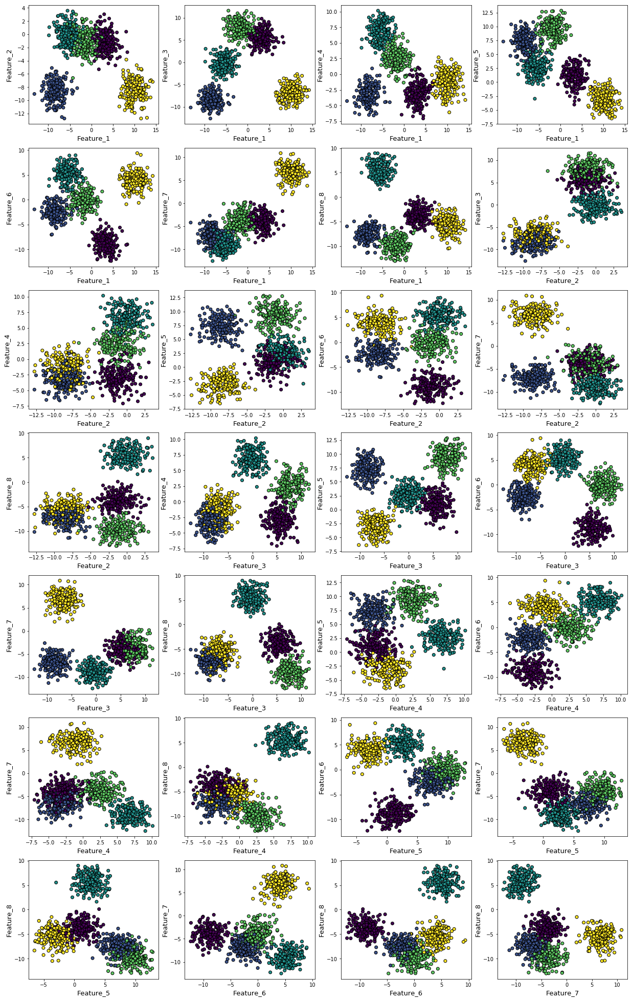

In [57]:
plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=preds_gm,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## PCA

In [58]:
from sklearn.decomposition import PCA

In [59]:
n_prin_comp = 3

In [62]:
pca_partial = PCA(n_components=n_prin_comp,svd_solver='full')
pca_partial.fit(X_scaled)


<bound method PCA.score of PCA(copy=True, iterated_power='auto', n_components=3, random_state=None,
  svd_solver='full', tol=0.0, whiten=False)>

In [69]:
pca_full = PCA(n_components=n_features,svd_solver='full')
pca_full.fit(X_scaled)

PCA(copy=True, iterated_power='auto', n_components=8, random_state=None,
  svd_solver='full', tol=0.0, whiten=False)

### How much variance is explained by principal components?

With the help of this plot, we can decide to work with only the first 3 principal components

In [70]:
pca_explained_var = pca_full.explained_variance_ratio_

In [71]:
cum_explaiend_var = pca_explained_var.cumsum()

In [72]:
cum_explaiend_var

array([0.38299553, 0.63446667, 0.84811548, 0.95580637, 0.97072204,
       0.98265301, 0.99238911, 1.        ])

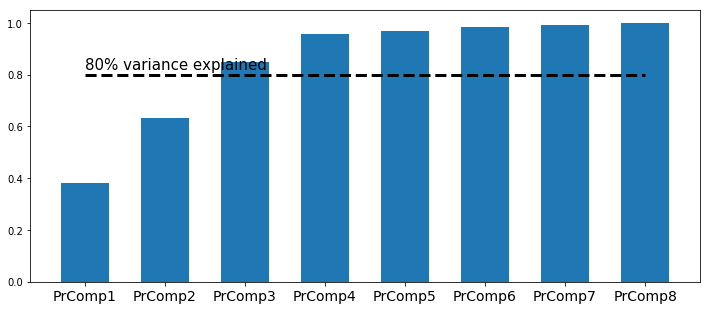

In [73]:
plt.figure(figsize=(12,5))
plt.bar(x=['PrComp'+str(i) for i in range(1,9)],height=cum_explaiend_var,width=0.6)
plt.xticks(fontsize=14)
plt.hlines(y=0.8,xmin='PrComp1',xmax='PrComp8',linestyles='dashed',lw=3)
plt.text(x='PrComp1',y=0.82,s="80% variance explained",fontsize=15)
plt.show()

### Transform the original variables in principal component space and create a DataFrame

In [74]:
X_pca = pca_partial.fit_transform(X_scaled)

In [85]:
df_pca = pd.DataFrame(data=X_pca,columns=['Principal_comp'+str(i) for i in range(1,n_prin_comp+1)])

### Running k-means on the transformed features

In [52]:
km_scores= []
km_silhouette = []
vmeasure_score =[]
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_pca)
    preds = km.predict(X_pca)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_pca)))
    km_scores.append(-km.score(X_pca))
    silhouette = silhouette_score(X_pca,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -227.5352428761106
Silhouette score for number of cluster(s) 2: 0.49135773575259944
V-measure score for number of cluster(s) 2: 0.4743509876140318
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -105.38086493705231
Silhouette score for number of cluster(s) 3: 0.5751135330588726
V-measure score for number of cluster(s) 3: 0.7665881447515969
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -39.623911414552005
Silhouette score for number of cluster(s) 4: 0.6870664844905016
V-measure score for number of cluster(s) 4: 0.8959235043677203
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -12.39486468550759
Silhouette score for number of cluster(s) 5: 0.7664980767108374
V-measure score for number of cluster

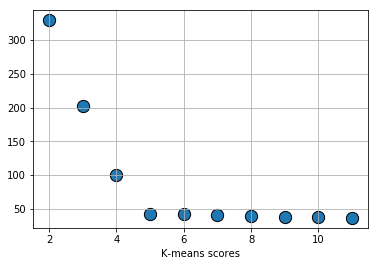

In [77]:
plt.scatter(x=[i for i in range(2,12)],y=km_scores,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("K-means scores")
plt.show()

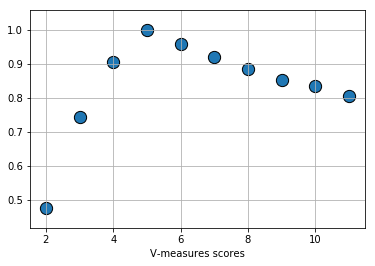

In [78]:
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("V-measures scores")
plt.show()

### K-means fitting with PCA-transformed data

In [80]:
km_pca = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_pca)
preds_km_pca = km_pca.predict(X_pca)

### Visualizing the clusters after running k-means on PCA-transformed features

In [86]:
col_pca_combi=list(combinations(df_pca.columns,2))
num_pca_combi = len(col_pca_combi)
col_pca_combi

[('Principal_comp1', 'Principal_comp2'),
 ('Principal_comp1', 'Principal_comp3'),
 ('Principal_comp2', 'Principal_comp3')]

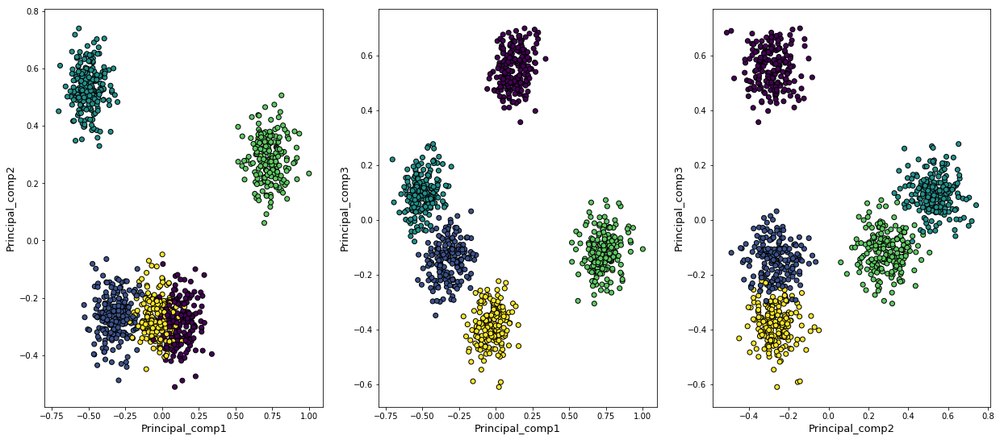

In [87]:
plt.figure(figsize=(21,20))
for i in range(1,num_pca_combi+1):
    plt.subplot(int(num_pca_combi/3)+1,3,i)
    dim1=col_pca_combi[i-1][0]
    dim2=col_pca_combi[i-1][1]
    plt.scatter(df_pca[dim1],df_pca[dim2],c=preds_km_pca,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## ICA

In [88]:
from sklearn.decomposition import FastICA

In [89]:
n_ind_comp = 3

In [90]:
ica_partial = FastICA(n_components=n_ind_comp)
ica_partial.fit(X_scaled)

FastICA(algorithm='parallel', fun='logcosh', fun_args=None, max_iter=200,
    n_components=3, random_state=None, tol=0.0001, w_init=None,
    whiten=True)

In [91]:
ica_full = FastICA(max_iter=1000)
ica_full.fit(X_scaled)

/Users/gabriel/anaconda3/envs/nf/lib/python3.6/site-packages/sklearn/decomposition/fastica_.py:121: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  ConvergenceWarning)


FastICA(algorithm='parallel', fun='logcosh', fun_args=None, max_iter=1000,
    n_components=None, random_state=None, tol=0.0001, w_init=None,
    whiten=True)

In [92]:
X_ica = ica_partial.fit_transform(X_scaled)

In [93]:
df_ica=pd.DataFrame(data=X_ica,columns=['Independent_comp'+str(i) for i in range(1,n_ind_comp+1)])

### Running k-means on the independent features

In [94]:
km_scores= []
km_silhouette = []
vmeasure_score =[]
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_ica)
    preds = km.predict(X_ica)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_ica)))
    km_scores.append(-km.score(X_ica))
    silhouette = silhouette_score(X_ica,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -2.0462665329115737
Silhouette score for number of cluster(s) 2: 0.41842530353850543
V-measure score for number of cluster(s) 2: 0.589727521756156
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -1.109470188975408
Silhouette score for number of cluster(s) 3: 0.5907643693816634
V-measure score for number of cluster(s) 3: 0.7918756684685213
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -0.21890903539053824
Silhouette score for number of cluster(s) 4: 0.7721005814062303
V-measure score for number of cluster(s) 4: 0.9057460992755191
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -0.1188461132749914
Silhouette score for number of cluster(s) 5: 0.7229275823636967
V-measure score for number of cluste

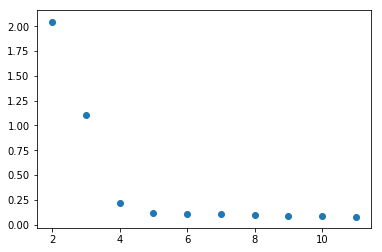

In [95]:
plt.scatter(x=[i for i in range(2,12)],y=km_scores)
plt.show()

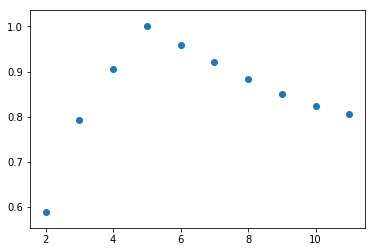

In [96]:
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score)
plt.show()

### K-means fitting with ICA-transformed data

In [97]:
km_ica = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_ica)
preds_km_ica = km_ica.predict(X_ica)

### Visualizing the clusters after running k-means on ICA-transformed features

In [98]:
col_ica_combi=list(combinations(df_ica.columns,2))
num_ica_combi = len(col_ica_combi)

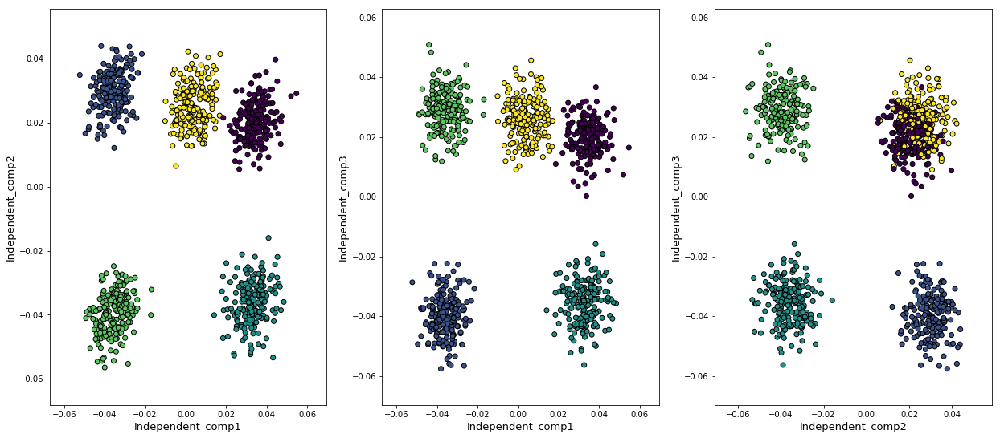

In [99]:
plt.figure(figsize=(21,20))
for i in range(1,num_ica_combi+1):
    plt.subplot(int(num_ica_combi/3)+1,3,i)
    dim1=col_ica_combi[i-1][0]
    dim2=col_ica_combi[i-1][1]
    plt.scatter(df_ica[dim1],df_ica[dim2],c=preds_km_ica,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## Random Projection

In [100]:
from sklearn.random_projection import GaussianRandomProjection

In [101]:
n_random_comp = 3

In [102]:
random_proj = GaussianRandomProjection(n_components=n_random_comp)

In [103]:
X_random_proj = random_proj.fit_transform(X_scaled)

In [104]:
df_random_proj=pd.DataFrame(data=X_random_proj,columns=['Random_projection'+str(i) for i in range(1,n_random_comp+1)])

### Running k-means on random projections

In [105]:
km_scores= []
km_silhouette = []
vmeasure_score = []
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_random_proj)
    preds = km.predict(X_random_proj)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_random_proj)))
    km_scores.append(-km.score(X_random_proj))
    silhouette = silhouette_score(X_random_proj,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -60.31562973569212
Silhouette score for number of cluster(s) 2: 0.5552923158926977
V-measure score for number of cluster(s) 2: 0.5573690984041048
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -26.988166954770158
Silhouette score for number of cluster(s) 3: 0.6161207283031152
V-measure score for number of cluster(s) 3: 0.784093974766219
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -17.0489213419975
Silhouette score for number of cluster(s) 4: 0.6120607326895824
V-measure score for number of cluster(s) 4: 0.8533181813201888
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -11.85135831262779
Silhouette score for number of cluster(s) 5: 0.5343945656059014
V-measure score for number of cluster(s) 

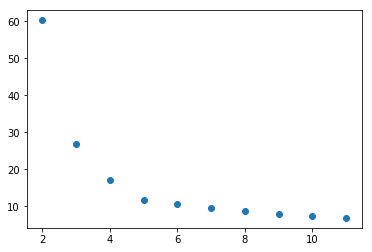

In [106]:
plt.scatter(x=[i for i in range(2,12)],y=km_scores)
plt.show()

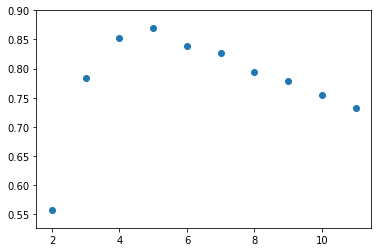

In [107]:
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score)
plt.show()

### K-means fitting with random-projected data

In [108]:
km_random_proj = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_random_proj)
preds_km_random_proj = km_random_proj.predict(X_random_proj)

### Visualizing the clusters after running k-means on random-projected features

In [109]:
col_random_proj_combi=list(combinations(df_random_proj.columns,2))
num_random_proj_combi = len(col_random_proj_combi)

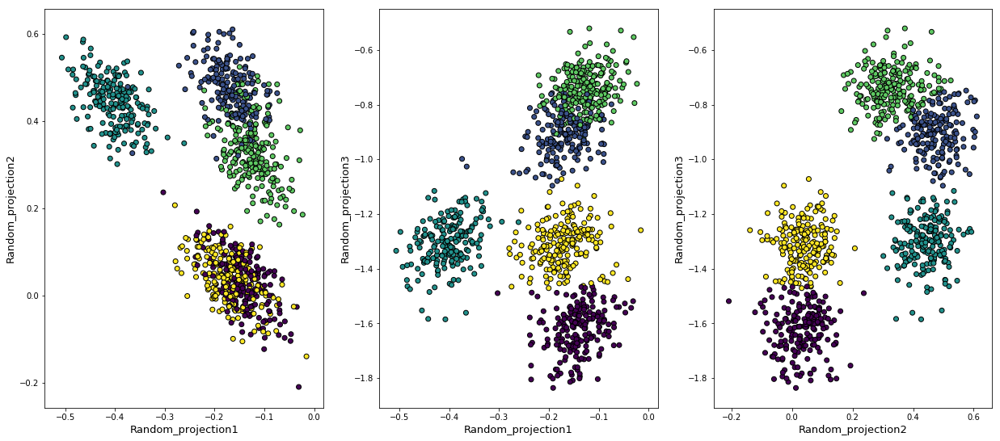

In [110]:
plt.figure(figsize=(21,20))
for i in range(1,num_random_proj_combi+1):
    plt.subplot(int(num_random_proj_combi/3)+1,3,i)
    dim1=col_random_proj_combi[i-1][0]
    dim2=col_random_proj_combi[i-1][1]
    plt.scatter(df_random_proj[dim1],df_random_proj[dim2],c=preds_km_random_proj,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)
plt.show()

In [111]:
def plot_cluster_rp(df_rp,preds_rp):
    """
    Plots clusters after running random projection
    """
    plt.figure(figsize=(21,12))
    for i in range(1,num_random_proj_combi+1):
        plt.subplot(int(num_random_proj_combi/3)+1,3,i)
        dim1=col_random_proj_combi[i-1][0]
        dim2=col_random_proj_combi[i-1][1]
        plt.scatter(df_rp[dim1],df_rp[dim2],c=preds_rp,edgecolor='k')
        plt.xlabel(f"{dim1}",fontsize=13)
        plt.ylabel(f"{dim2}",fontsize=13)
    plt.show()

### Running the random projections many times

Score for iteration 0: -52.2245687880512
Silhouette score for iteration 0: 0.5829250266402396
V-measure score for iteration 0: 0.9003879361766997
----------------------------------------------------------------------------------------------------


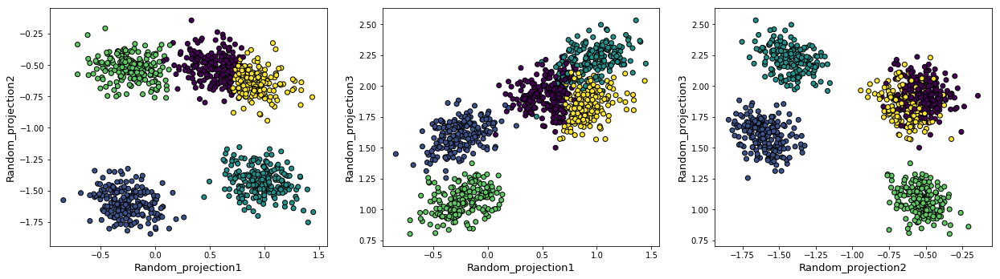

Score for iteration 1: -44.2141633731008
Silhouette score for iteration 1: 0.5926878761293797
V-measure score for iteration 1: 0.9607573867917023
----------------------------------------------------------------------------------------------------


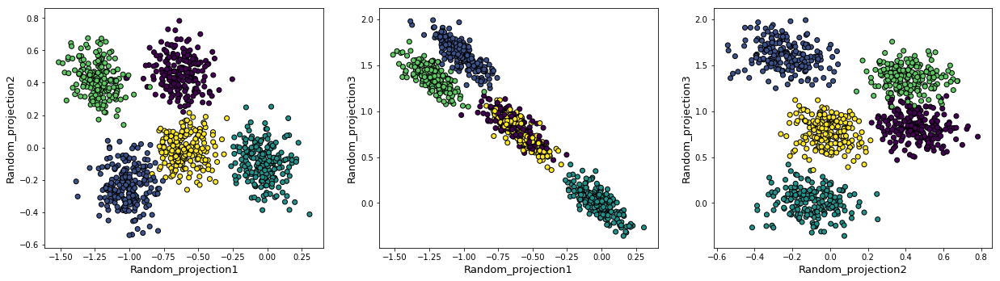

Score for iteration 2: -30.220259485564878
Silhouette score for iteration 2: 0.5782783189496811
V-measure score for iteration 2: 0.9960866319013288
----------------------------------------------------------------------------------------------------


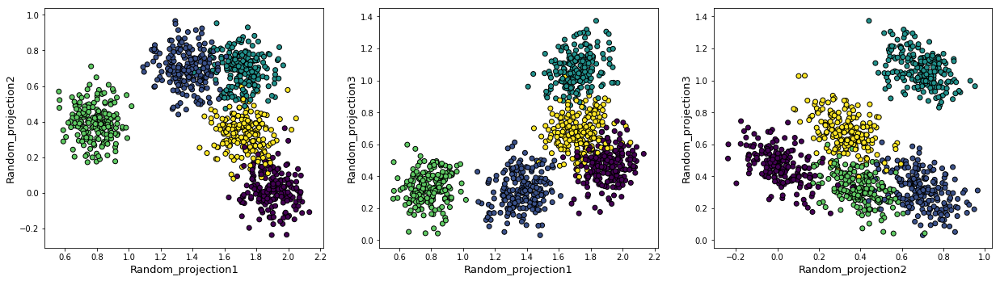

Score for iteration 3: -28.096523362773194
Silhouette score for iteration 3: 0.6062395515571457
V-measure score for iteration 3: 0.9396752141173461
----------------------------------------------------------------------------------------------------


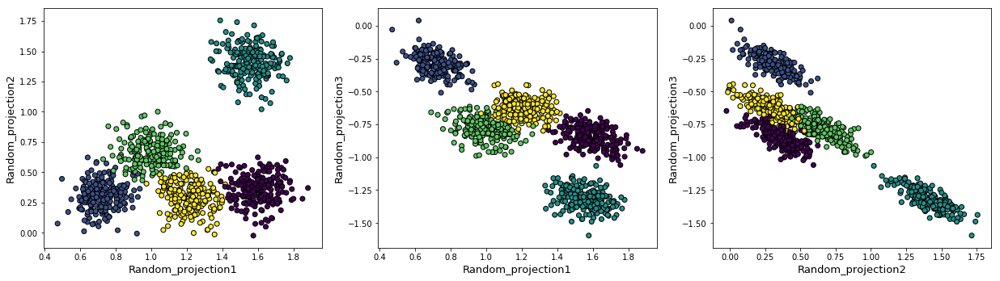

Score for iteration 4: -39.565473692118914
Silhouette score for iteration 4: 0.6603220744835123
V-measure score for iteration 4: 0.9821683264079725
----------------------------------------------------------------------------------------------------


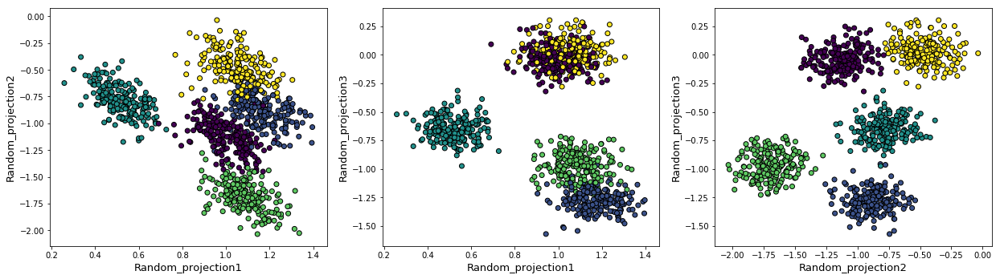

Score for iteration 5: -28.343824872383436
Silhouette score for iteration 5: 0.5182259018622328
V-measure score for iteration 5: 0.8095144547154449
----------------------------------------------------------------------------------------------------


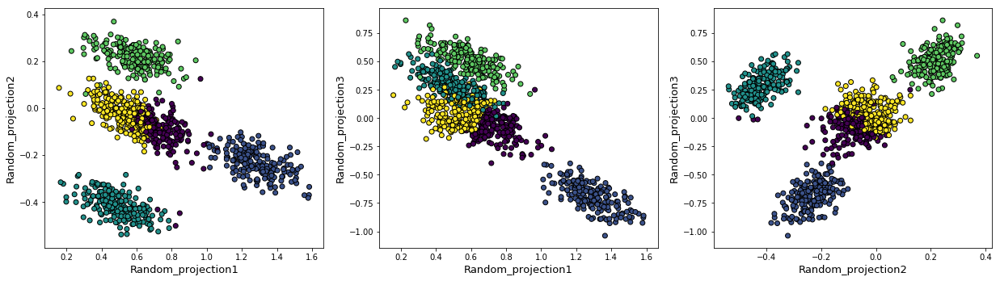

Score for iteration 6: -41.729666050474265
Silhouette score for iteration 6: 0.5099683430042883
V-measure score for iteration 6: 0.8986680413645635
----------------------------------------------------------------------------------------------------


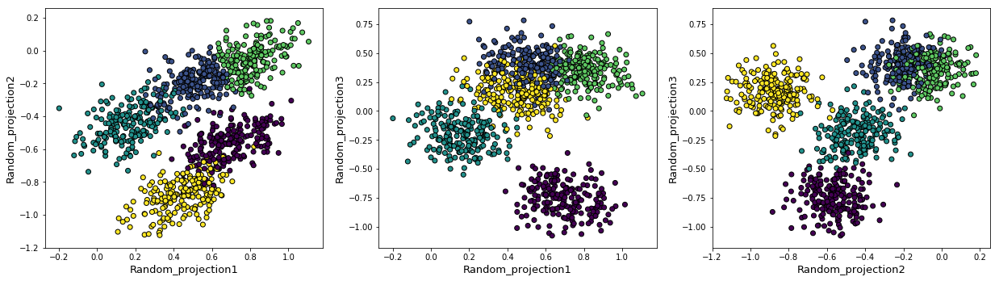

In [ ]:
rp_score= []
rp_silhouette = []
rp_vmeasure = []
for i in range(20):
    random_proj = GaussianRandomProjection(n_components=n_random_comp)
    X_random_proj = random_proj.fit_transform(X_scaled)
    df_random_proj=pd.DataFrame(data=X_random_proj,columns=['Random_projection'+str(i) for i in range(1,n_random_comp+1)])
    
    km = KMeans(n_clusters=5, random_state=0).fit(X_random_proj)
    preds = km.predict(X_random_proj)
    print("Score for iteration {}: {}".format(i,km.score(X_random_proj)))
    rp_score.append(-km.score(X_random_proj))
    
    silhouette = silhouette_score(X_random_proj,preds)
    rp_silhouette.append(silhouette)
    print("Silhouette score for iteration {}: {}".format(i,silhouette))
    
    v_measure = v_measure_score(y,preds)
    rp_vmeasure.append(v_measure)
    print("V-measure score for iteration {}: {}".format(i,v_measure))
    print("-"*100)
    
    plot_cluster_rp(df_random_proj,preds)

In [ ]:
plt.scatter(x=[i for i in range(20)],y=rp_score)
plt.show()

In [ ]:
plt.scatter(x=[i for i in range(20)],y=rp_silhouette)
plt.show()

In [ ]:
plt.scatter(x=[i for i in range(20)],y=rp_vmeasure)
plt.show()

### This kind of variation does not happen with PCA

In [86]:
pca_score= []
pca_silhouette = []
pca_vmeasure = []
for i in range(20):
    pca_partial = PCA(n_components=n_prin_comp,svd_solver='full')
    X_pca=pca_partial.fit_transform(X_scaled)
    km = KMeans(n_clusters=5, random_state=0).fit(X_pca)
    preds = km.predict(X_pca)
    print("Score for iteration {}: {}".format(i,km.score(X_pca)))
    rp_score.append(-km.score(X_pca))
    silhouette = silhouette_score(X_pca,preds)
    rp_silhouette.append(silhouette)
    print("Silhouette score for iteration {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    rp_vmeasure.append(v_measure)
    print("V-measure score for iteration {}: {}".format(i,v_measure))
    print("-"*100)

Score for iteration 0: -12.39486468550759
Silhouette score for iteration 0: 0.7664980767108374
V-measure score for iteration 0: 1.0
----------------------------------------------------------------------------------------------------
Score for iteration 1: -12.39486468550759
Silhouette score for iteration 1: 0.7664980767108374
V-measure score for iteration 1: 1.0
----------------------------------------------------------------------------------------------------
Score for iteration 2: -12.39486468550759
Silhouette score for iteration 2: 0.7664980767108374
V-measure score for iteration 2: 1.0
----------------------------------------------------------------------------------------------------
Score for iteration 3: -12.39486468550759
Silhouette score for iteration 3: 0.7664980767108374
V-measure score for iteration 3: 1.0
----------------------------------------------------------------------------------------------------
Score for iteration 4: -12.39486468550759
Silhouette score for itera